# Assignment 1-

Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

reading the training data

In [2]:
data=pd.read_csv('WEEK 1 train.csv')
final_test=pd.read_csv('week 1 test.csv')
target=data['failure']
train=data.drop(['failure'],axis=1)
print(train.shape)
train.head(5)

(16108, 25)


,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,measurement_8,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17
0,0,A,80.10,material_7,material_8,9,5,7,8,4,...,20.155,10.672,15.859,17.594,15.193,15.029,NaN,13.034,14.684,764.100
1,1,A,84.89,material_7,material_8,9,5,14,3,3,...,17.889,12.448,17.947,17.915,11.755,14.732,15.425,14.395,15.631,682.057
2,2,A,82.43,material_7,material_8,9,5,12,1,5,...,18.288,12.715,15.607,NaN,13.798,16.711,18.631,14.094,17.946,663.376
3,3,A,101.07,material_7,material_8,9,5,13,2,6,...,19.060,12.471,16.346,18.377,10.020,15.250,15.562,16.154,17.172,826.282
4,4,A,188.06,material_7,material_8,9,5,9,2,8,...,18.093,10.337,17.082,19.932,12.428,16.182,12.760,13.153,16.412,579.885


This might take a while

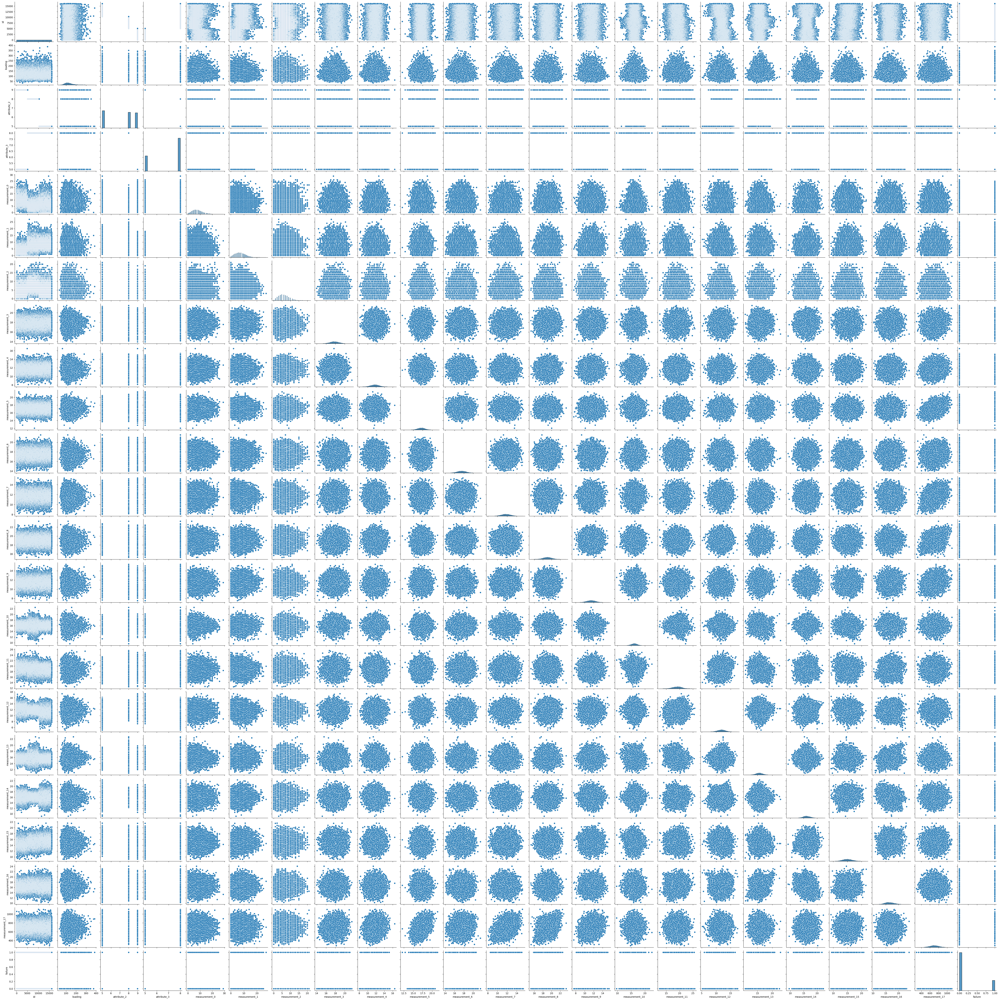

In [3]:
sns.pairplot(data)

<AxesSubplot:>

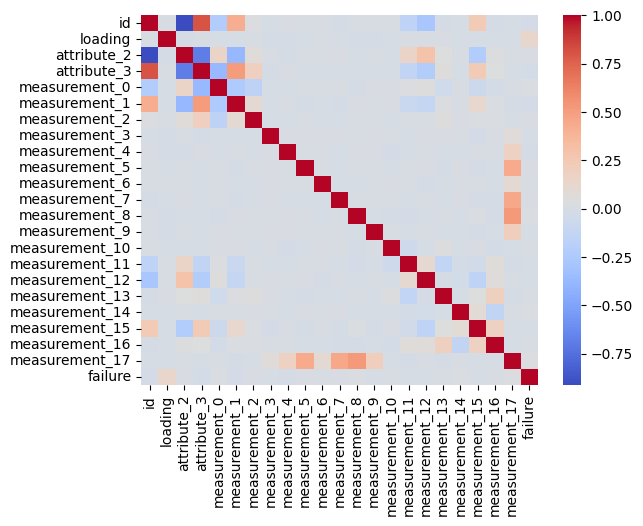

In [4]:
sns.heatmap(data.corr(),cmap='coolwarm')

## Feature Selections

Seeing what data is present in both test and train sets so we can choose features.

/tmp/ipykernel_3739/4161606693.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


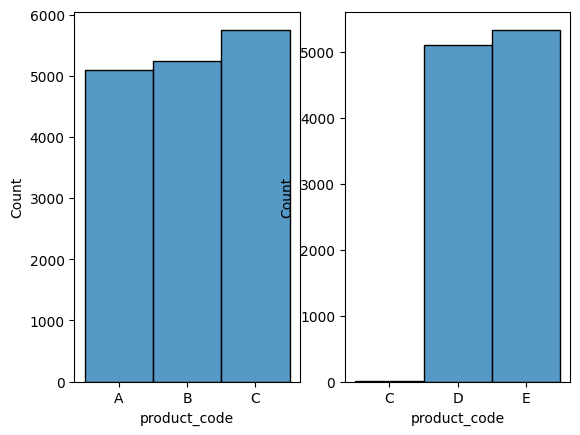

In [7]:
fig, ax =plt.subplots(1,2)
sns.histplot(train['product_code'],ax=ax[0])
sns.histplot(final_test['product_code'],ax=ax[1])
fig.show()


/tmp/ipykernel_3739/777159080.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


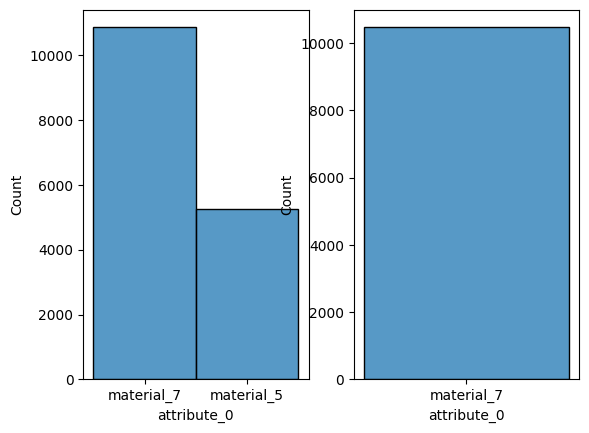

In [8]:
fig, ax =plt.subplots(1,2)
sns.histplot(train['attribute_0'],ax=ax[0])
sns.histplot(final_test['attribute_0'],ax=ax[1])

fig.show()


/tmp/ipykernel_3739/2844970329.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


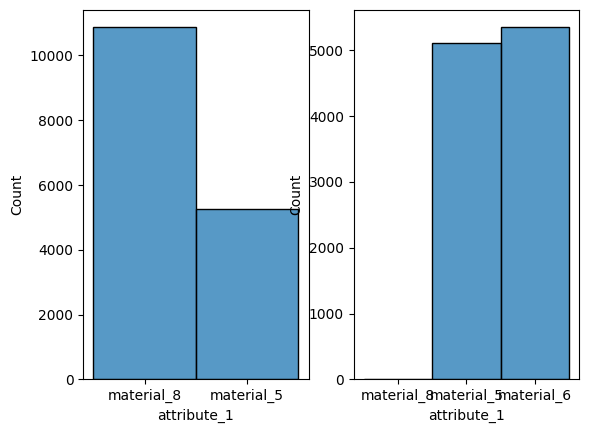

In [9]:
fig, ax =plt.subplots(1,2)
sns.histplot(train['attribute_1'],ax=ax[0])
sns.histplot(final_test['attribute_1'],ax=ax[1])

fig.show()


/tmp/ipykernel_3739/1949280312.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


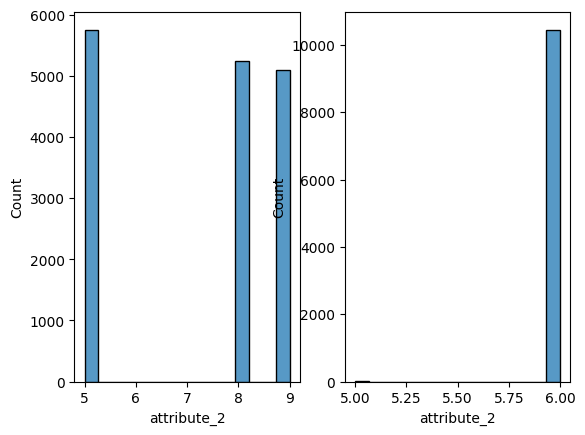

In [10]:
fig, ax =plt.subplots(1,2)
sns.histplot(train['attribute_2'],ax=ax[0])
sns.histplot(final_test['attribute_2'],ax=ax[1])

fig.show()


/tmp/ipykernel_3739/652604018.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


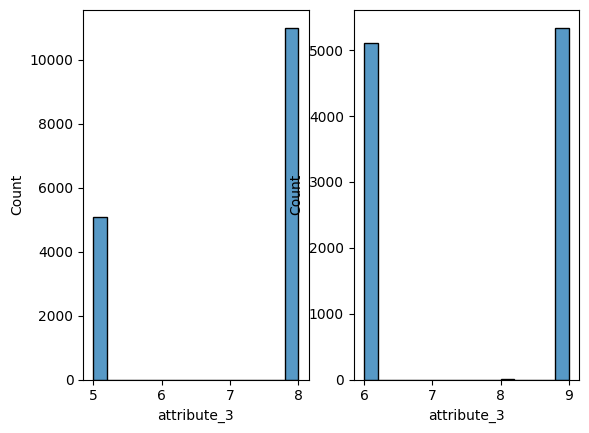

In [11]:
fig, ax =plt.subplots(1,2)
sns.histplot(train['attribute_3'],ax=ax[0])
sns.histplot(final_test['attribute_3'],ax=ax[1])
fig.show()


We can leave attributes 2 and 3 they heve very less intersection in the test dataset and the train dataset.
Note that I am considering all attributes to be categorical data.

In [12]:
final_test.drop(['attribute_2','attribute_3','id'],axis=1,inplace=True)

processed_train=train.drop(['attribute_2','attribute_3','id'],axis=1)
processed_train.head()

,product_code,loading,attribute_0,attribute_1,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,...,measurement_8,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17
0,A,80.10,material_7,material_8,7,8,4,18.040,12.518,15.748,...,20.155,10.672,15.859,17.594,15.193,15.029,NaN,13.034,14.684,764.100
1,A,84.89,material_7,material_8,14,3,3,18.213,11.540,17.717,...,17.889,12.448,17.947,17.915,11.755,14.732,15.425,14.395,15.631,682.057
2,A,82.43,material_7,material_8,12,1,5,18.057,11.652,16.738,...,18.288,12.715,15.607,NaN,13.798,16.711,18.631,14.094,17.946,663.376
3,A,101.07,material_7,material_8,13,2,6,17.295,11.188,18.576,...,19.060,12.471,16.346,18.377,10.020,15.250,15.562,16.154,17.172,826.282
4,A,188.06,material_7,material_8,9,2,8,19.346,12.950,16.990,...,18.093,10.337,17.082,19.932,12.428,16.182,12.760,13.153,16.412,579.885


## One hot encoding
using one hot encoding for the categorical variables attributes 0 and 1

In [13]:
attribute_0 = pd.get_dummies(processed_train['attribute_0'])
attribute_1 = pd.get_dummies(processed_train['attribute_1'])
attribute_1['material_5_1']=attribute_1.material_5
attribute_1.drop('material_5',axis=1,inplace=True)
processed_train=pd.concat([processed_train,attribute_0,attribute_1],axis=1)
processed_train.drop(['attribute_0','attribute_1'],axis=1,inplace=True)
processed_train.head()



,product_code,loading,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,measurement_6,measurement_7,...,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,material_5,material_7,material_8,material_5_1
0,A,80.10,7,8,4,18.040,12.518,15.748,19.292,11.739,...,15.193,15.029,NaN,13.034,14.684,764.100,0,1,1,0
1,A,84.89,14,3,3,18.213,11.540,17.717,17.893,12.748,...,11.755,14.732,15.425,14.395,15.631,682.057,0,1,1,0
2,A,82.43,12,1,5,18.057,11.652,16.738,18.240,12.718,...,13.798,16.711,18.631,14.094,17.946,663.376,0,1,1,0
3,A,101.07,13,2,6,17.295,11.188,18.576,18.339,12.583,...,10.020,15.250,15.562,16.154,17.172,826.282,0,1,1,0
4,A,188.06,9,2,8,19.346,12.950,16.990,15.746,11.306,...,12.428,16.182,12.760,13.153,16.412,579.885,0,1,1,0


In [14]:
final_test['material_5']=0
attribute_0 = pd.get_dummies(final_test['attribute_0'])
attribute_1 = pd.get_dummies(final_test['attribute_1'])
attribute_1['material_5_1']=attribute_1.material_5
attribute_1.drop('material_5',axis=1,inplace=True)
final_test=pd.concat([final_test,attribute_0,attribute_1],axis=1)
final_test.drop(['attribute_0','attribute_1'],axis=1,inplace=True)
final_test.drop(['material_6'],axis=1,inplace=True)
final_test.head()

,product_code,loading,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,measurement_6,measurement_7,...,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,material_5,material_7,material_8,material_5_1
0,C,145.08,9,7,8,16.863,10.156,18.038,16.607,10.934,...,11.303,16.717,16.768,14.707,17.190,658.222,0,1,1,0
1,C,146.34,2,7,1,18.303,12.670,17.570,15.942,12.557,...,9.195,16.047,NaN,15.759,18.393,616.670,0,1,1,0
2,C,118.14,1,9,3,16.883,12.024,16.738,16.299,11.304,...,9.365,16.182,15.934,12.487,14.615,433.006,0,1,1,0
3,C,119.86,10,9,9,17.686,10.697,16.481,16.394,NaN,...,11.836,15.767,18.049,15.346,15.337,572.642,0,1,1,0
4,C,122.66,8,9,9,18.132,13.269,NaN,16.503,12.544,...,11.959,16.202,14.098,14.110,15.025,486.221,0,1,1,0


## Missing values-
I used imputation for filling missing values.
I imputed with the respective means of the group with the same product_code as that made more sense

product_code         0
loading            139
measurement_0        0
measurement_1        0
measurement_2        0
measurement_3      228
measurement_4      320
measurement_5      427
measurement_6      490
measurement_7      560
measurement_8      640
measurement_9      745
measurement_10     805
measurement_11     878
measurement_12     957
measurement_13    1052
measurement_14    1084
measurement_15    1203
measurement_16    1289
measurement_17    1345
material_5           0
material_7           0
material_8           0
material_5_1         0
dtype: int64


<AxesSubplot:>

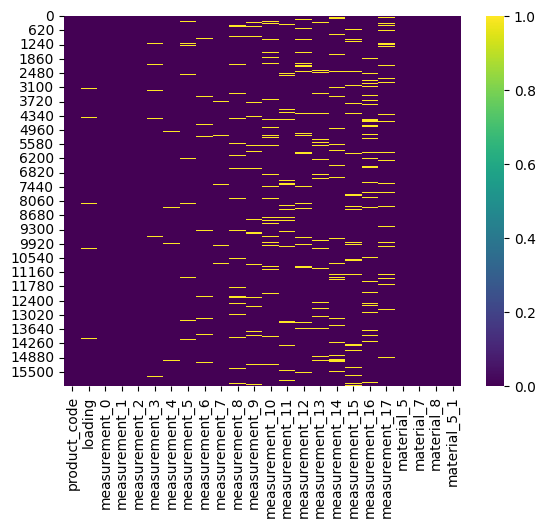

In [15]:
print(processed_train.isna().sum())
sns.heatmap(processed_train.isnull(),cmap='viridis')

<AxesSubplot:>

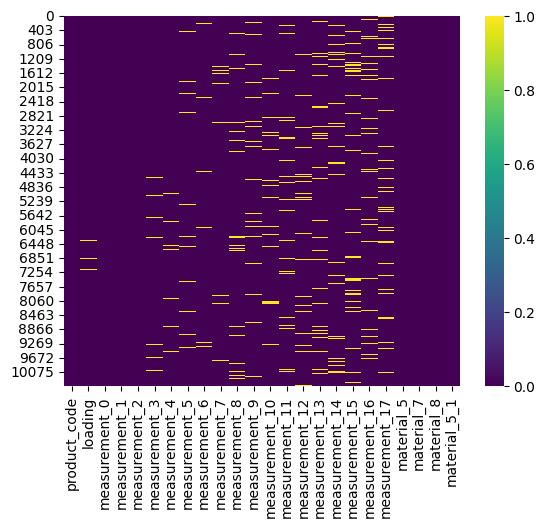

In [16]:
sns.heatmap(final_test.isnull(),cmap='viridis')

Filling the missing values.

In [17]:
missing=['loading','measurement_3', 'measurement_4', 'measurement_5',
       'measurement_6', 'measurement_7', 'measurement_8', 'measurement_9',
       'measurement_10', 'measurement_11', 'measurement_12', 'measurement_13',
       'measurement_14', 'measurement_15', 'measurement_16', 'measurement_17']

processed_train[missing] = processed_train[missing].fillna(processed_train.groupby('product_code')[missing].transform('mean'))
processed_train=processed_train.drop(['product_code'],axis=1)


final_test[missing] = final_test[missing].fillna(final_test.groupby('product_code')[missing].transform('mean'))
final_test.drop(['product_code'],axis=1,inplace=True)

<AxesSubplot:>

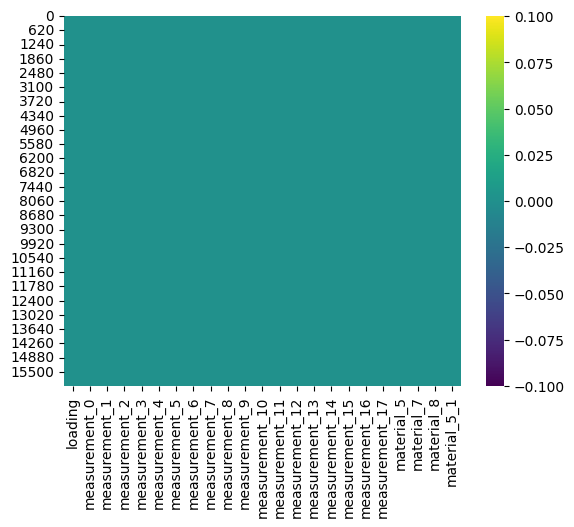

In [18]:
sns.heatmap(processed_train.isnull(),cmap='viridis')


<AxesSubplot:>

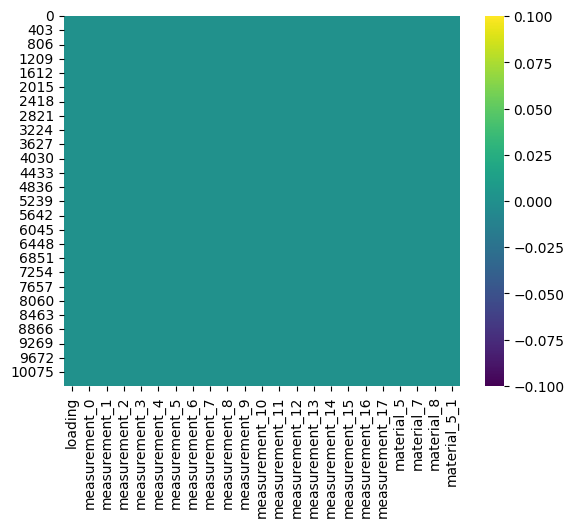

In [19]:
sns.heatmap(final_test.isnull(),cmap='viridis')

## Scaling

Scaling the data using a StandardScaler

In [20]:

from sklearn.preprocessing import StandardScaler

st_x= StandardScaler()

categorical=["material_5","material_7","material_8","material_5_1"]
categorical_data=processed_train[categorical]

scaled_train= st_x.fit_transform(processed_train)
processed_train=pd.DataFrame(scaled_train,columns=processed_train.columns)
processed_train[categorical]=categorical_data
processed_train.head()

,loading,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,measurement_6,measurement_7,measurement_8,...,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,material_5,material_7,material_8,material_5_1
0,-1.223434,-0.202224,0.191481,-0.665457,0.244566,0.798387,-1.408105,1.814342,0.015280,1.141123,...,2.467575,-0.547211,0.003250,-1.239770,-1.087968,0.584937,0,1,1,0
1,-1.100202,1.373260,-1.051115,-0.971859,0.417960,-0.190510,0.590082,0.395435,1.040070,-1.144705,...,-0.018530,-0.793129,-0.478591,-0.394658,-0.523100,-0.181162,0,1,1,0
2,-1.163490,0.923122,-1.548154,-0.359055,0.261605,-0.077262,-0.403430,0.747373,1.009600,-0.742214,...,1.458815,0.845495,1.773654,-0.581564,0.857756,-0.355601,0,1,1,0
3,-0.683943,1.148191,-1.299634,-0.052652,-0.502129,-0.546432,1.461815,0.847781,0.872488,0.036541,...,-1.273153,-0.364222,-0.382347,0.697592,0.396079,1.165578,0,1,1,0
4,1.554029,0.247914,-1.299634,0.560153,1.553539,1.235200,-0.147695,-1.782115,-0.424495,-0.938920,...,0.468133,0.407480,-2.350778,-1.165877,-0.057248,-1.135221,0,1,1,0


In [21]:

st_x= StandardScaler()

categorical=["material_5","material_7","material_8","material_5_1"]
categorical_data=final_test[categorical]

scaled_test= st_x.fit_transform(final_test)
final_test=pd.DataFrame(scaled_test,columns=final_test.columns)
final_test[categorical]=categorical_data
final_test.head()

,loading,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,measurement_6,measurement_7,measurement_8,...,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,material_5,material_7,material_8,material_5_1
0,0.437817,0.679394,-0.695893,0.478126,-0.932724,-1.611882,0.940069,-0.940942,-0.786705,-0.821162,...,-0.183221,1.171477,0.555254,-0.182154,0.505865,-0.321987,0,1,1,0
1,0.470286,-1.364174,-0.695893,-1.596843,0.524569,0.950293,0.462915,-1.624396,0.868615,-0.471265,...,-1.561208,0.471063,0.364945,0.634537,1.266082,-0.634892,0,1,1,0
2,-0.256413,-1.656113,-0.194676,-1.003994,-0.912483,0.291914,-0.385358,-1.257489,-0.409337,-2.362674,...,-1.450080,0.612191,-0.017045,-1.905590,-1.121367,-2.017965,0,1,1,0
3,-0.212089,0.971333,-0.194676,0.774550,-0.099840,-1.060515,-0.647384,-1.159853,0.343529,0.417535,...,0.165198,0.178352,1.434288,0.313916,-0.665110,-0.966443,0,1,1,0
4,-0.139935,0.387456,-0.194676,0.774550,0.351516,1.560771,0.227737,-1.047828,0.855356,-0.973586,...,0.245602,0.633099,-1.276926,-0.645618,-0.862274,-1.617232,0,1,1,0


## Removing Outliers

For removing outliers I removed any row in which atleast one entry was more than 4 standard deviations away from the mean.

I tried removing outliers and getting results but it didn't improve the quality of results so I generated the results without removing the outliers.

In [76]:
processed_train['failure']=target
for col in processed_train.columns[:-1]:
    mean=processed_train[col].mean()
    sd=processed_train[col].std()
    processed_train=processed_train[abs(processed_train[col]-mean) < 4*sd ]
target=processed_train['failure']
processed_train.drop(['failure'],axis=1,inplace=True)

,loading,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,measurement_6,measurement_7,measurement_8,...,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,material_5,material_7,material_8,material_5_1,failure
count,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,...,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,1.610800e+04,16108.000000,16108.000000,16108.000000,16108.000000,16108.000000
mean,1.932069e-16,-2.823115e-17,-5.646230e-17,1.129246e-16,-3.642700e-15,-9.916191e-16,1.066608e-15,-1.448170e-15,-6.431409e-16,-1.342082e-15,...,1.042788e-15,-3.281871e-16,-6.493164e-16,-8.557567e-16,-4.194972e-16,0.325925,0.674075,0.674075,0.325925,0.212876
std,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,...,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,0.468734,0.468734,0.468734,0.468734,0.409353
min,-2.431048e+00,-1.777709e+00,-1.796673e+00,-1.891066e+00,-3.836701e+00,-3.761863e+00,-5.137581e+00,-3.585414e+00,-3.754807e+00,-3.837060e+00,...,-3.974328e+00,-4.893862e+00,-3.646571e+00,-3.724418e+00,-3.868500e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-7.052964e-01,-6.523626e-01,-8.025961e-01,-6.654569e-01,-6.617417e-01,-6.718133e-01,-6.703287e-01,-6.563204e-01,-6.492077e-01,-6.564703e-01,...,-6.302189e-01,-6.233080e-01,-6.698940e-01,-6.740099e-01,-6.224746e-01,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-1.306890e-01,-2.022242e-01,-5.703846e-02,-5.265221e-02,-4.366597e-03,-4.151004e-04,-2.836622e-03,1.484190e-03,1.856388e-03,6.185196e-03,...,-5.785975e-02,-1.198230e-03,2.261988e-02,-5.820392e-02,-3.437205e-03,0.000000,1.000000,1.000000,0.000000,0.000000
75%,5.310036e-01,6.980527e-01,6.885191e-01,5.601525e-01,6.705336e-01,6.780611e-01,6.611195e-01,6.631916e-01,6.652954e-01,6.561660e-01,...,5.846729e-01,6.266317e-01,6.485370e-01,6.346715e-01,6.245432e-01,1.000000,1.000000,1.000000,1.000000,0.000000
max,6.642784e+00,4.749299e+00,4.913346e+00,4.543383e+00,3.711439e+00,4.808576e+00,4.353047e+00,4.097371e+00,3.684819e+00,4.341887e+00,...,5.815187e+00,4.353268e+00,4.095428e+00,4.524927e+00,3.791333e+00,1.000000,1.000000,1.000000,1.000000,1.000000


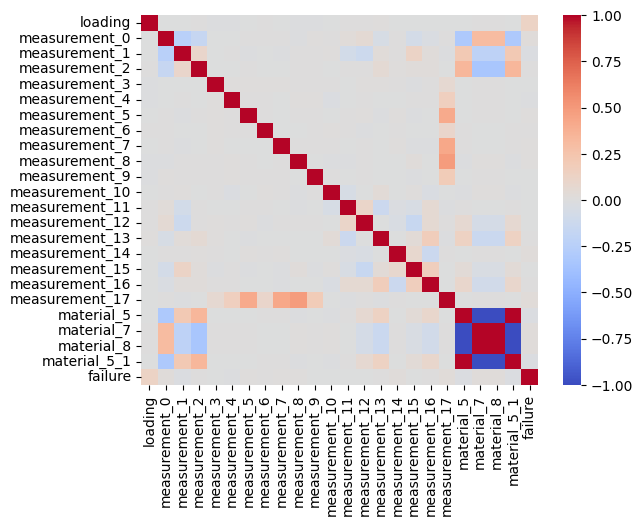

In [22]:
dat=processed_train.copy()
dat['failure']=target
sns.heatmap(dat.corr(),cmap='coolwarm')
dat.describe()

splitting into train data and validation data

In [23]:
from sklearn.model_selection import train_test_split

X=processed_train
y=target
X_train,X_val,y_train,y_val=train_test_split(X,y,test_size=.1,random_state=40,shuffle=True)
print(X_train.shape,X_val.shape)
# print(X_train.head())
y_val

(14497, 23) (1611, 23)


6656     1
5432     0
654      0
11833    0
14648    0
        ..
11424    0
11222    0
2092     0
4889     1
14051    0
Name: failure, Length: 1611, dtype: int64

## Models-
Trying different models and analyzing their performance based on roc curve

In [24]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

def plot_roc(X_val,y_val,model):
    y_pred_proba = model.predict_proba(X_val)[::,1]
    fpr, tpr, _ = roc_curve(y_val,  y_pred_proba)
    auc = roc_auc_score(y_val, y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()

[[1263    1]
 [ 345    2]]


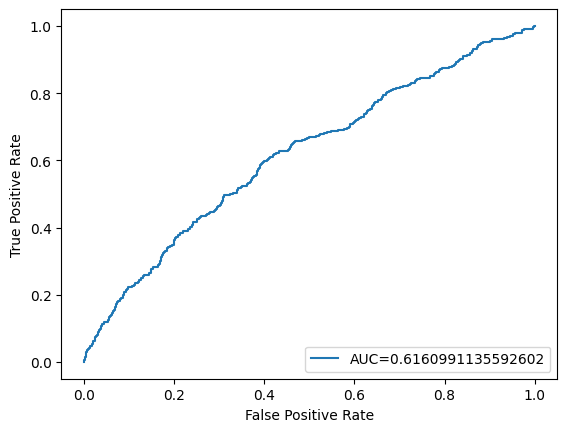

In [36]:
from sklearn.linear_model import LogisticRegression
# X_train,X_val,y_train,y_val=train_test_split(X,y,test_size=.2,shuffle=True)

log_model=LogisticRegression(max_iter=100,random_state=20)
log_model.fit(X_train,y_train)
log_predictions=log_model.predict(X_val)
print(confusion_matrix(y_val,log_predictions))
plot_roc(X_val,y_val,log_model)

[[1264    0]
 [ 347    0]]


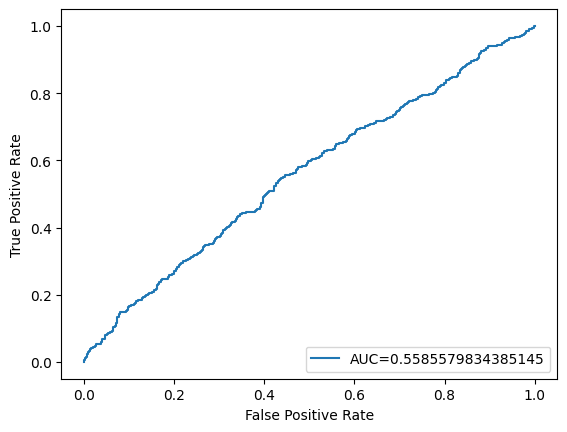

In [125]:
from sklearn.svm import SVC
sv_model=SVC(probability=True)
sv_model.fit(X_train,y_train)
sv_predictions=sv_model.predict(X_val)
print(confusion_matrix(y_val,sv_predictions))
plot_roc(X_val,y_val,sv_model)

[[1254   10]
 [ 345    2]]


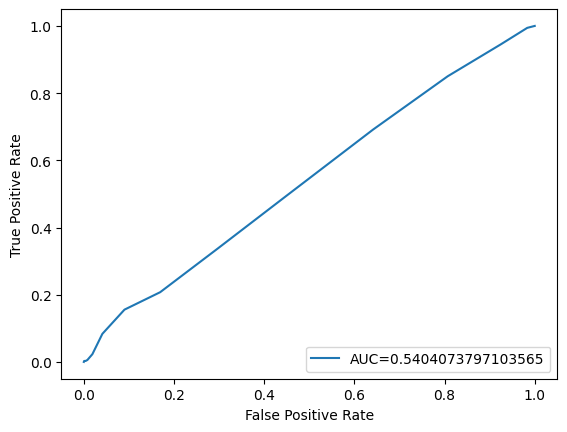

In [26]:
from sklearn.ensemble import RandomForestClassifier  

forest_model= RandomForestClassifier(n_estimators=20)
forest_model.fit(X_train,y_train)
print(confusion_matrix(y_val,forest_model.predict(X_val)))
plot_roc(X_val,y_val,forest_model)

[[1237   27]
 [ 338    9]]


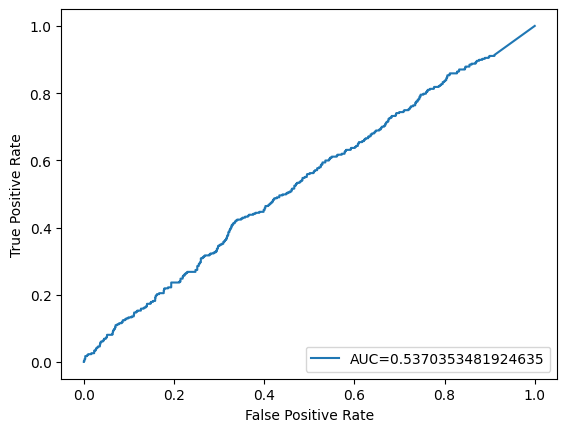

In [27]:
from sklearn.neighbors import KNeighborsClassifier
knn_model=KNeighborsClassifier(n_neighbors=10,weights='distance')
knn_model.fit(X_train,y_train)
knn_predictions=knn_model.predict(X_val)
print(confusion_matrix(y_val,knn_predictions))
plot_roc(X_val,y_val,knn_model)


[[1238   26]
 [ 325   22]]


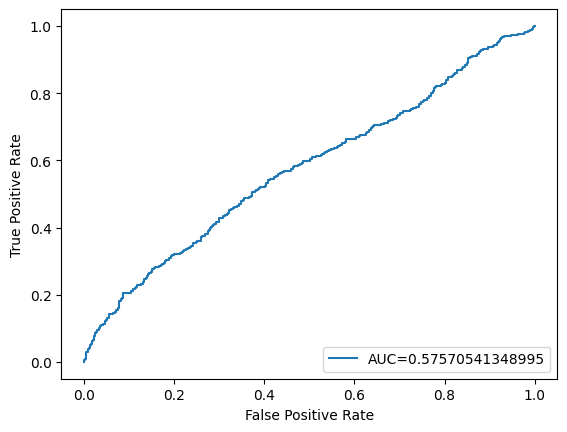

In [28]:
from sklearn.naive_bayes import GaussianNB
bayes_model=GaussianNB()
bayes_model.fit(X_train,y_train)
bayes_predictions=bayes_model.predict(X_val)
print(confusion_matrix(y_val,bayes_predictions))
plot_roc(X_val,y_val,bayes_model)

[[1223   41]
 [ 331   16]]


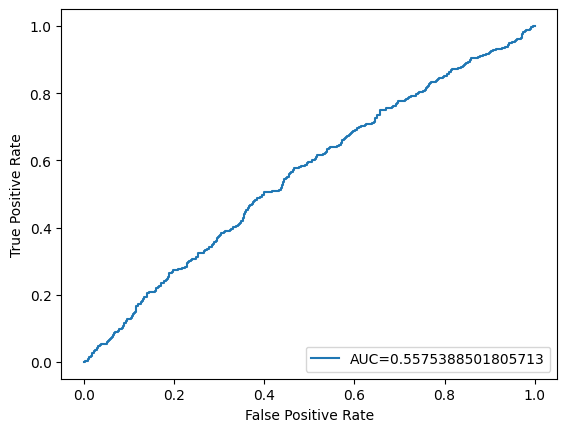

In [29]:
from xgboost import XGBClassifier

boost_model = XGBClassifier(random_state=24)
boost_model.fit(X_train, y_train)
boost_predictions=boost_model.predict(X_val)
print(confusion_matrix(y_val,boost_predictions))
plot_roc(X_val,y_val,boost_model)

[[1264    0]
 [ 347    0]]


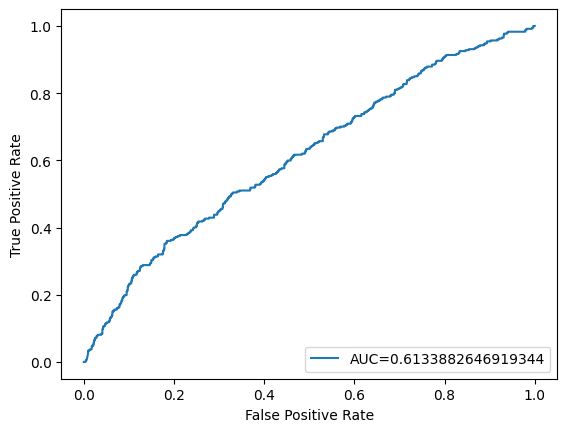

In [35]:
from sklearn.neural_network import MLPClassifier

neural_model=MLPClassifier(hidden_layer_sizes=(6,6),activation='relu',solver='adam',max_iter=900)
neural_model.fit(X_train,y_train)

neural_predictions=neural_model.predict(X_val)
print(confusion_matrix(y_val,neural_predictions))
plot_roc(X_val,y_val,neural_model)

## Prediction-
Choosing the model with the best AUC and using that

In [43]:
model=LogisticRegression()

model.fit(processed_train,target)
predicted_probabilities=model.predict_proba(final_test)[::,1]
predicted_probabilities=pd.DataFrame(predicted_probabilities)
predicted_probabilities.index+=16108
predicted_probabilities.rename(columns={0:'failure_probability'},inplace=True)
predicted_probabilities.to_csv('results.csv')
